In [4]:
#import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
#load the datasets
df = pd.read_csv(r"C:\Users\ADEDOYIN\Documents\Dataset.csv")
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


**Task 2**: **Data Visualization**

**Compare average ratings across cuisines and cities.**

In [7]:
# Calculate the average rating for restaurants in each city
city_ratings = df.groupby('City')['Aggregate rating'].mean()
top_ten_cities = city_ratings.sort_values(ascending=False).head(10)
top_ten_cities

City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
Beechworth          4.600000
London              4.535000
Taguig City         4.525000
Lincoln             4.500000
Tagaytay City       4.500000
Name: Aggregate rating, dtype: float64

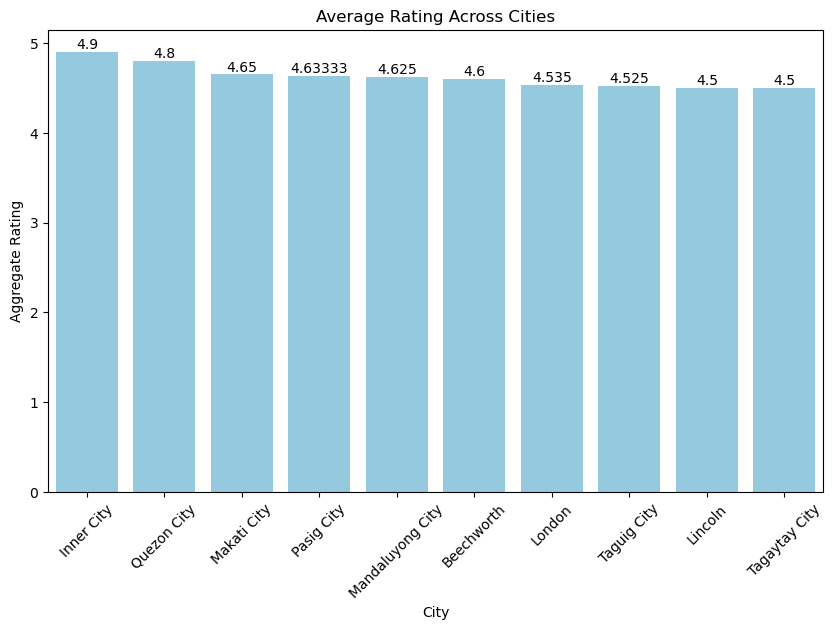

In [41]:
#plot barchart for visualization
plt.figure(figsize=(10, 6))
sns.barplot(x=top_ten_cities.index, y=top_ten_cities.values, color='skyblue')

plt.xticks(rotation=45)  # Rotate labels for better visibility

plt.xlabel('City')
plt.ylabel('Aggregate Rating')
plt.title('Average Rating Across Cities')

# Add labels above each bar
for bars in plt.gca().containers:
    plt.bar_label(bars)

plt.show()

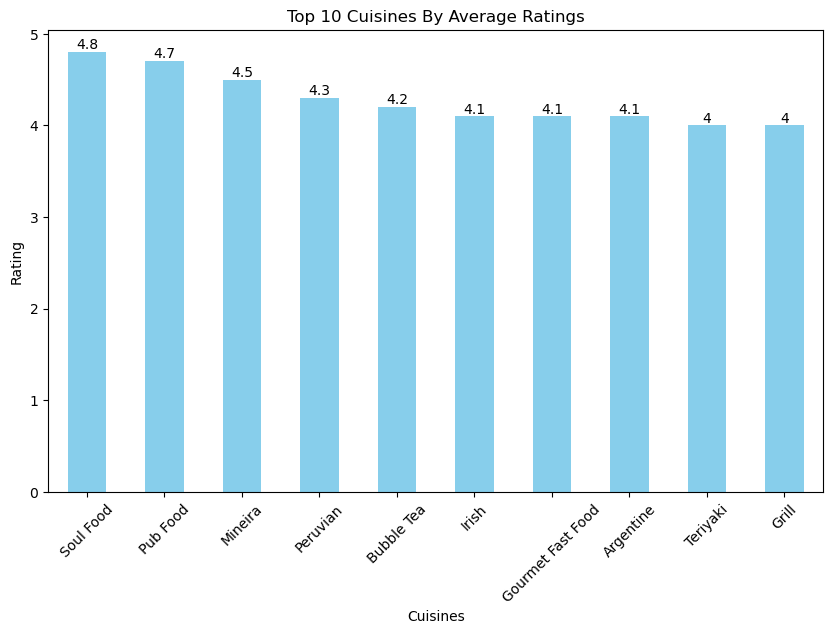

In [39]:
#split cuisines 
df["Cuisines"] = df["Cuisines"].str.split(", ").explode().reset_index(drop=True)

#plot barchart for visualization

plt.figure(figsize=(10,6))
plot = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False).head(10).plot(kind='bar',color='skyblue')

plt.xlabel('Cuisines')
plt.ylabel('Rating')
plt.title('Top 10 Cuisines By Average Ratings')
plt.xticks(rotation=45)

# Add labels above each bar
for bars in plt.gca().containers:
    plt.bar_label(bars)

plt.show()


**observation**:
 The bar plot compares the average ratings of the top 10 cuisines and cities, implying that:
*  Inner City has the highest average rating of 4.9, making them the top-rated locations among all cities.
*  Soul Food has the highest average cuisine rating of 4.8 across restaurants.

**Geospatial Analysis:Map restaurant, locations using coordinates**

In [53]:
!pip install folium

import folium
# Calculate the map center

map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
my_map = folium.Map(location=map_center, zoom_start=12)

# adding marker for each restaurants
for index, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(my_map)
    
# Save the map as an HTML file
my_map.save('restaurant_map.html')
my_map

**Observation**:
The map clearly shows that the restaurants are spread across various locations around the world

**Analyze distribution across cities**

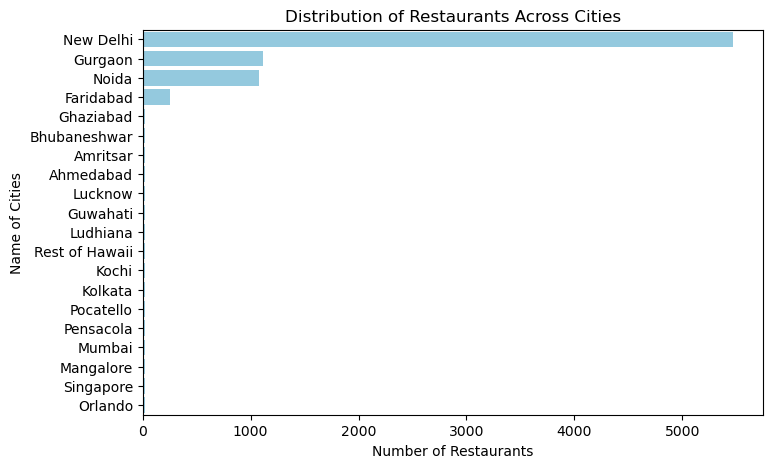

In [65]:
#Distribution of restaurants across different cities or countries
# Set plot size
plt.figure(figsize=(8, 5))

# Create the figure object
# There are many cities names present in the data, so i select only the top 20 cities
sns.countplot(y = df['City'], order=df.City.value_counts().iloc[:20].index, color='skyblue')


plt.xlabel('Number of Restaurants')
plt.ylabel('Name of Cities')
plt.title('Distribution of Restaurants Across Cities')

plt.show()

**Observation**:New Delhi have the most number of restaurants. Followed by Gurgaon, Noida and Faridabad.

**Correlate location with ratings**

Text(0.5, 1.0, "Correlation Between Restaurant's location and Rating")

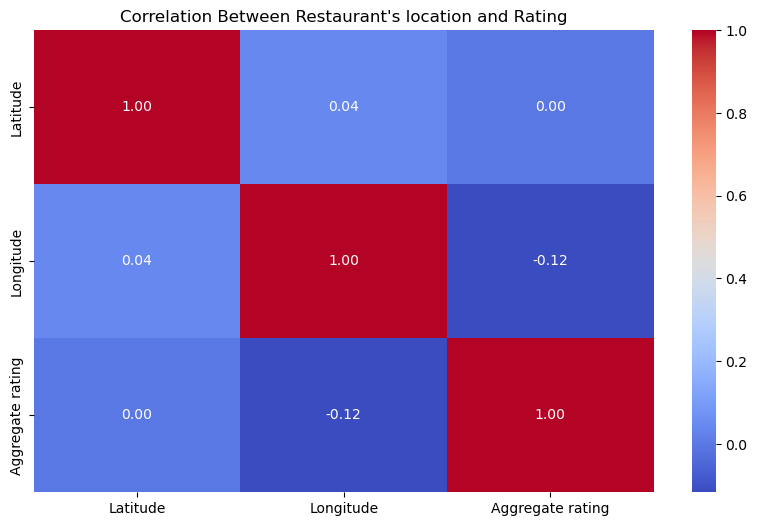

In [70]:
# Checking correlation between the restaurant's location and its rating
# Set plot size
plt.figure(figsize=(10, 6))

# Calculate the correlation between latitude, longitude, and ratings
correlation_matrix = df[['Latitude', 'Longitude', 'Aggregate rating']].corr()

# Create a heatmap to visualize the correlation
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

# Set Title
plt.title("Correlation Between Restaurant's location and Rating")

# Display Chart

**Observation**:There is no correlation between Latitude and Rating. But, Longitude and Rating are negatively correlated.

**Identify outliers and their effect**

In [29]:
num_cols = df.select_dtypes(include=np.number).columns
num_cols
     

Index(['Restaurant ID', 'Country Code', 'Longitude', 'Latitude',
       'Average Cost for two', 'Price range', 'Aggregate rating', 'Votes'],
      dtype='object')

Restaurant ID 
 Skew = 0.061569976479250714


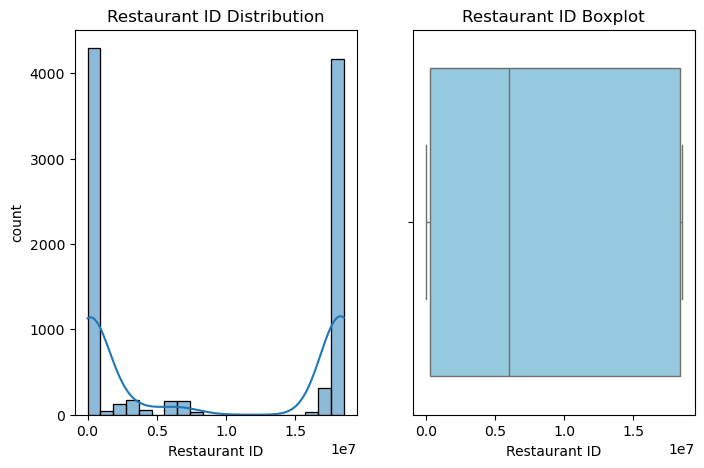

Country Code 
 Skew = 3.043965346403779


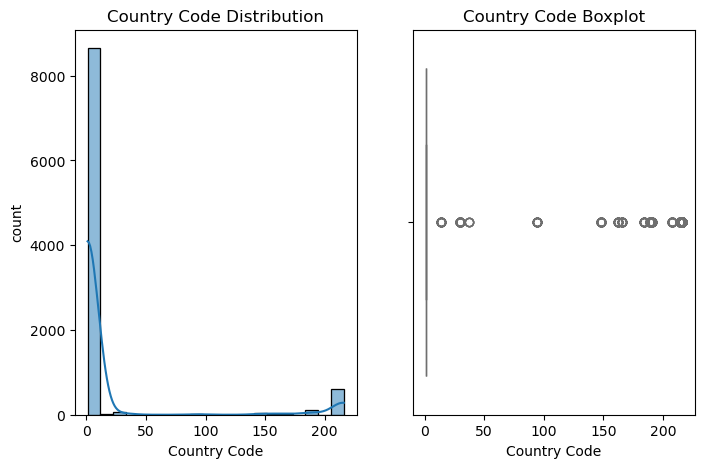

Longitude 
 Skew = -2.8073278338140857


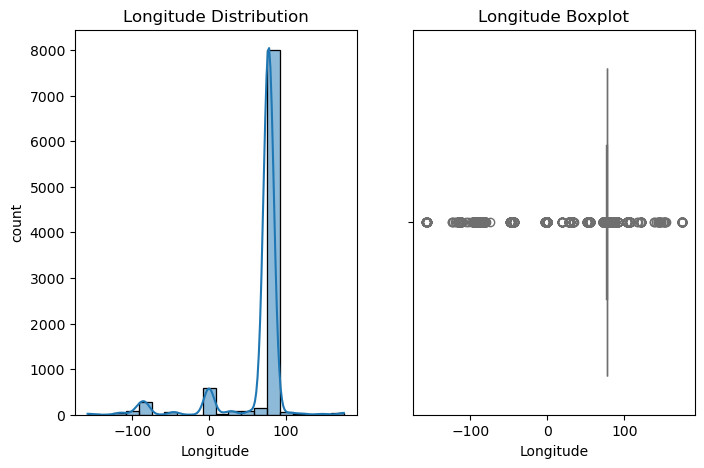

Latitude 
 Skew = -3.08163535060857


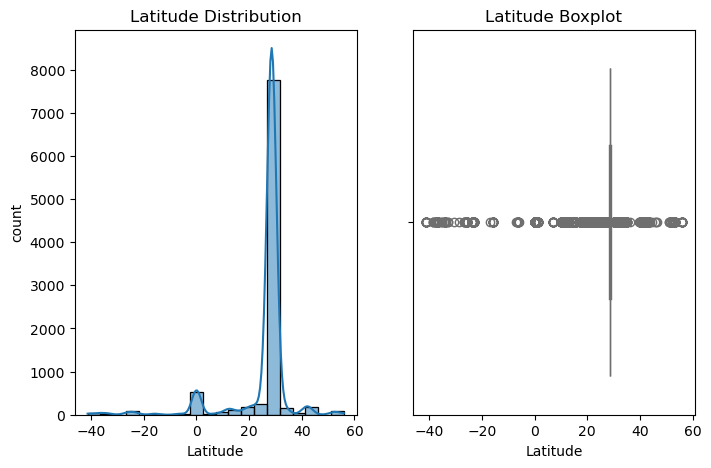

Average Cost for two 
 Skew = 35.477914900871276


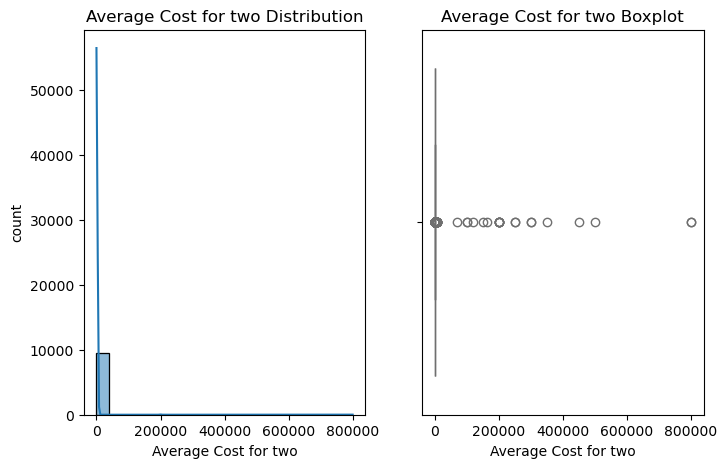

Price range 
 Skew = 0.8896175931442


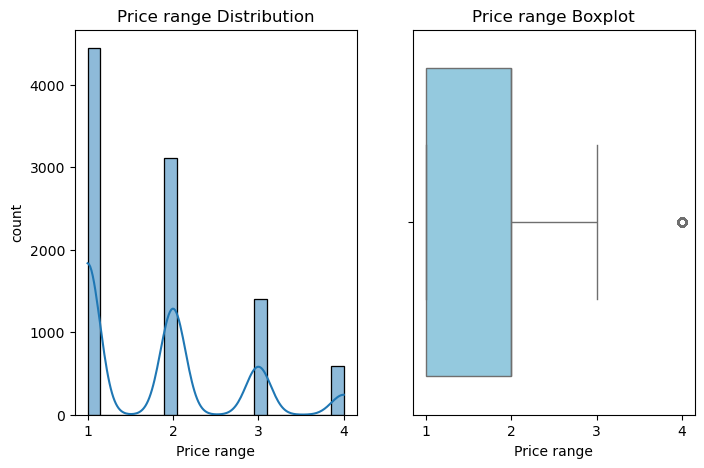

Aggregate rating 
 Skew = -0.9541304733200109


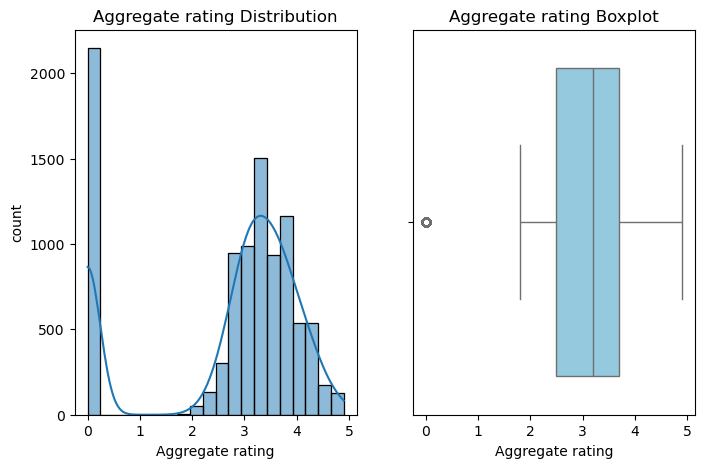

Votes 
 Skew = 8.807636687709472


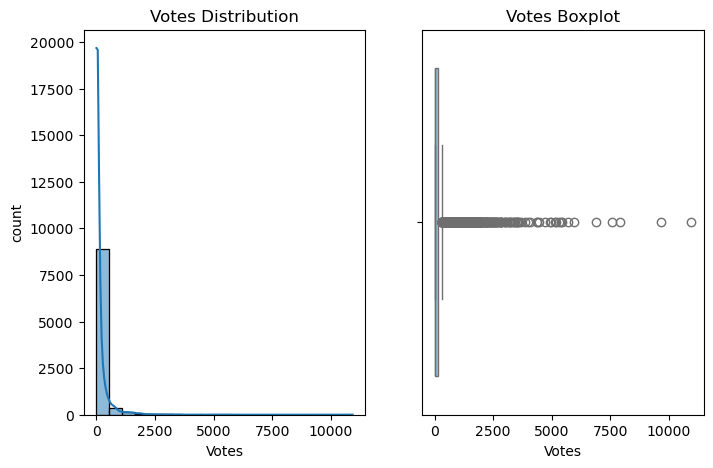

In [31]:
# loop through numerical columns
for col in num_cols:
    skewness = df[col].skew()
    print(f'{col} \n Skew = {skewness}')
    plt.figure(figsize=(8, 5))
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], kde=True, bins=20)
    plt.title(f'{col} Distribution')
    plt.xlabel(col)
    plt.ylabel("count")

    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col], color= 'skyblue')
    plt.title(f'{col} Boxplot')
    plt.xlabel(col)
    plt.show()

**Observations**: According to the boxplot visualization:

*  Votes has many outliers, indicating some restaurants receive significantly higher votes than others, likely due to popularity.
*  Most ratings are consistent except one extreme outliers
*  Effect of Outliers: Votes outliers may skew the average, while the rating outlier could influence customer perception.

**Determine relationship between votes and ratings**


Correlation between Votes and Aggregate Rating: 0.31


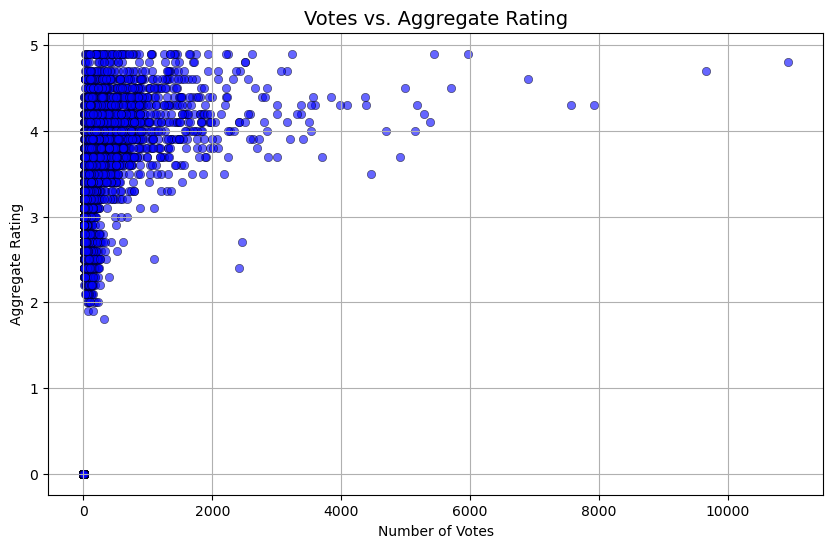

In [24]:
#Analyze if there is a correlation between the number of votes and the rating of a restaurant.
correlation = df['Votes'].corr(df['Aggregate rating'])
print(f"\nCorrelation between Votes and Aggregate Rating: {correlation:.2f}")


plt.figure(figsize=(10, 6))
sns.scatterplot(x='Votes', y='Aggregate rating', data=df, color='blue', alpha=0.6, edgecolor='black')
plt.title('Votes vs. Aggregate Rating', fontsize=14)
plt.xlabel('Number of Votes')
plt.ylabel('Aggregate Rating')
plt.grid(True)
plt.show()

**Observation**:
*  Using a scatter plot to check the correlation between votes and rating and it shows that there is a weak positive correlation between the two variables

